# Advanced Lane Finding

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
from   moviepy.editor import VideoFileClip
%matplotlib inline

## Camera Calibration

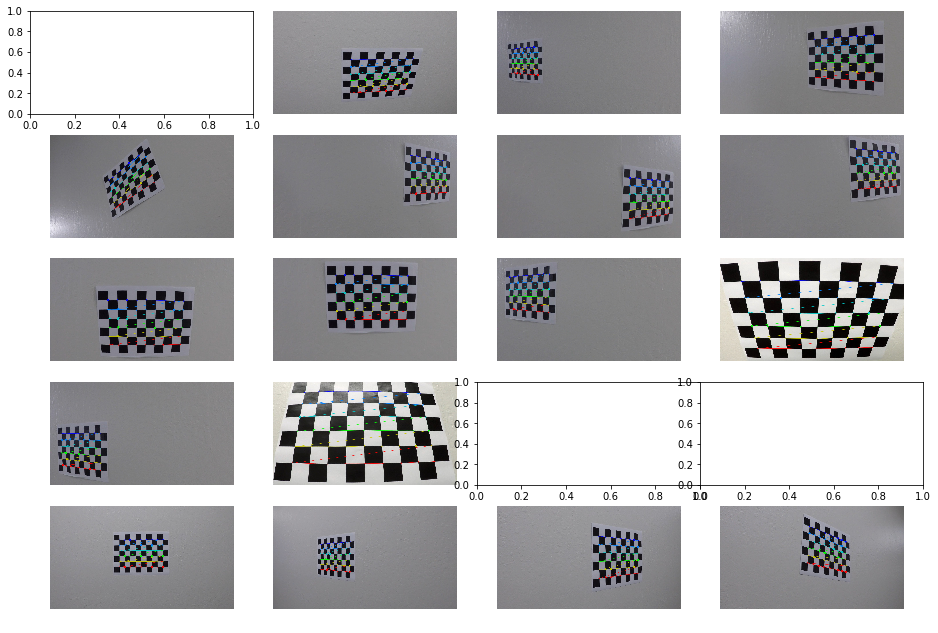

In [2]:
# Read in and make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Arrays to store object points and image points
objpoints = [] # 3D points in real world space 
imgpoints = [] # 2D points in image plane

# Prepare object points like (0,0,0), (1,0,0), (2,0,0) ....,(8,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # x, y coordinates

# Prepare figures 
fig, axs = plt.subplots(5,4, figsize=(16, 11))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    # read in each image
    img = mpimg.imread(fname)

    # Convert image to grayscale
    # mpimg.imread() reads in RGB
    # cv2.imread() and glob API reads in BGR
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    
    # If corners are found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        # draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        axs[i].axis('off')
        axs[i].imshow(img)


## Distortion Correction

In [3]:
# Function that undistorts an image using camera calibration matrix 
def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

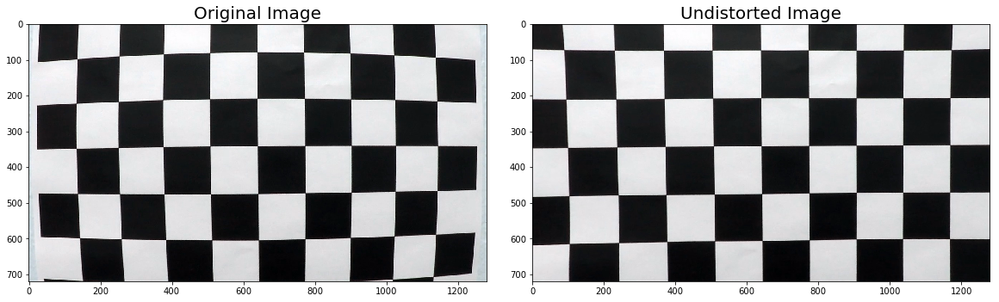

In [4]:
# Test undistortion on an image
img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Undistort the image
undist = undistort(img, mtx, dist)

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=20)

## Pipeline (Single Images)

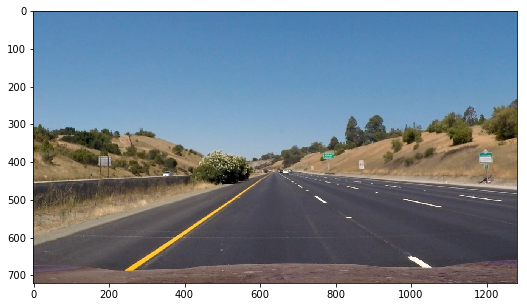

In [5]:
# Choose an image to demonstrate each step of the pipeline
img = cv2.imread('./test_images/straight_lines1.jpg')
plt.figure(figsize=(10,5))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

## Undistort Image

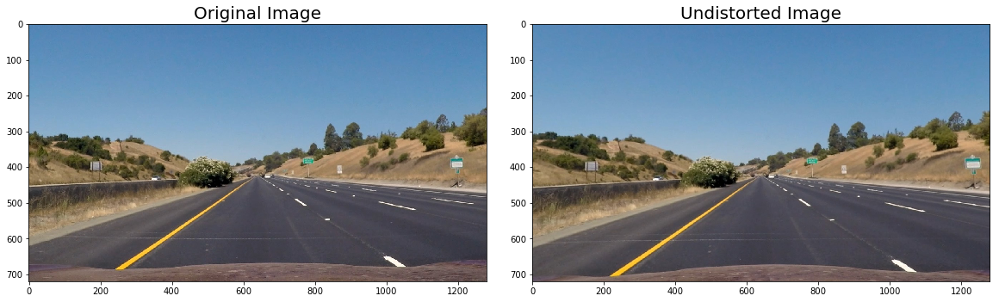

In [6]:
img_undistort = undistort(img, mtx, dist)

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(img_undistort)
ax2.set_title('Undistorted Image', fontsize=20)


## Color & Gradient Threshold

## Visualize colorspace channels

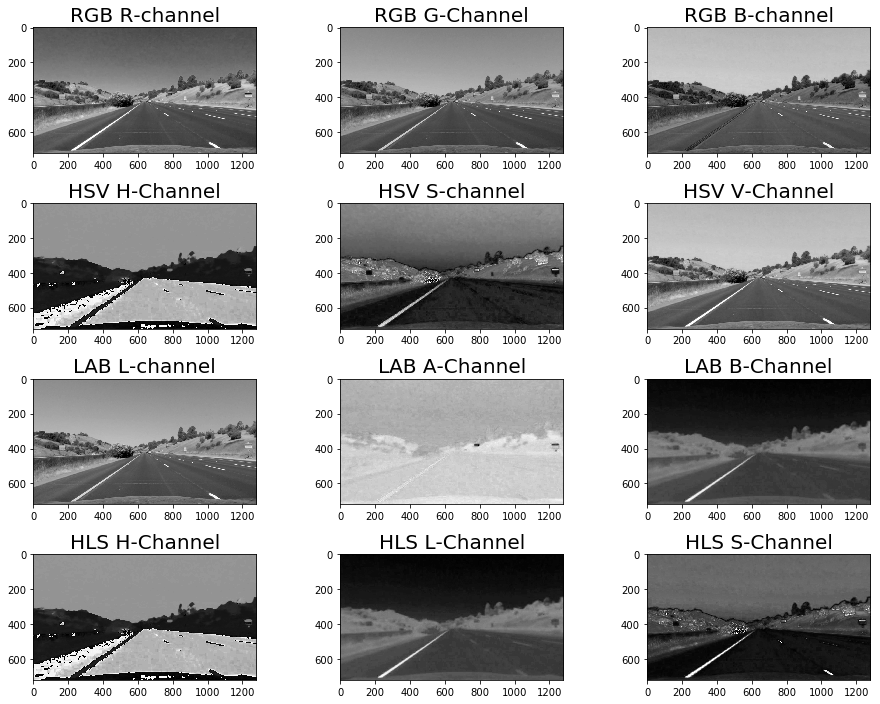

In [7]:
# Visualize multiple color space channels
img_undistort_R   = img_undistort[:,:,0]
img_undistort_G   = img_undistort[:,:,1]
img_undistort_B   = img_undistort[:,:,2]
img_undistort_HSV = cv2.cvtColor(img_undistort, cv2.COLOR_RGB2HSV)
img_undistort_H   = img_undistort_HSV[:,:,0]
img_undistort_S   = img_undistort_HSV[:,:,1]
img_undistort_V   = img_undistort_HSV[:,:,2]
img_undistort_LAB = cv2.cvtColor(img_undistort, cv2.COLOR_RGB2Lab)
img_undistort_L   = img_undistort_LAB[:,:,0]
img_undistort_A   = img_undistort_LAB[:,:,1]
img_undistort_B2  = img_undistort_LAB[:,:,2]
img_undistort_HLS = cv2.cvtColor(img_undistort, cv2.COLOR_RGB2HLS)
img_undistort_H2  = img_undistort_HLS[:,:,0]
img_undistort_L2  = img_undistort_HLS[:,:,1]
img_undistort_S2  = img_undistort_HLS[:,:,2]
fig, axs = plt.subplots(4,3, figsize=(16, 12))
fig.subplots_adjust(hspace=.4, wspace=.1)
axs = axs.ravel()
axs[0].imshow(img_undistort_R, cmap='gray')
axs[0].set_title('RGB R-channel', fontsize=20)
axs[1].imshow(img_undistort_G, cmap='gray')
axs[1].set_title('RGB G-Channel', fontsize=20)
axs[2].imshow(img_undistort_B, cmap='gray')
axs[2].set_title('RGB B-channel', fontsize=20)
axs[3].imshow(img_undistort_H, cmap='gray')
axs[3].set_title('HSV H-Channel', fontsize=20)
axs[4].imshow(img_undistort_S, cmap='gray')
axs[4].set_title('HSV S-channel', fontsize=20)
axs[5].imshow(img_undistort_V, cmap='gray')
axs[5].set_title('HSV V-Channel', fontsize=20)
axs[6].imshow(img_undistort_L, cmap='gray')
axs[6].set_title('LAB L-channel', fontsize=20)
axs[7].imshow(img_undistort_A, cmap='gray')
axs[7].set_title('LAB A-Channel', fontsize=20)
axs[8].imshow(img_undistort_B2, cmap='gray')
axs[8].set_title('LAB B-Channel', fontsize=20)
axs[9].imshow(img_undistort_H2, cmap='gray')
axs[9].set_title('HLS H-Channel', fontsize=20)
axs[10].imshow(img_undistort_B2, cmap='gray')
axs[10].set_title('HLS L-Channel', fontsize=20)
axs[11].imshow(img_undistort_S2, cmap='gray')
axs[11].set_title('HLS S-Channel', fontsize=20)

## Sobel Absolute Threshold

In [61]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values
# applies Sobel x or y, 
# then takes an absolute value and applies a threshold.  
def abs_sobel_threshold(img, orient='x', sobel_kernel=15, thresh_min=30, thresh_max=100):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

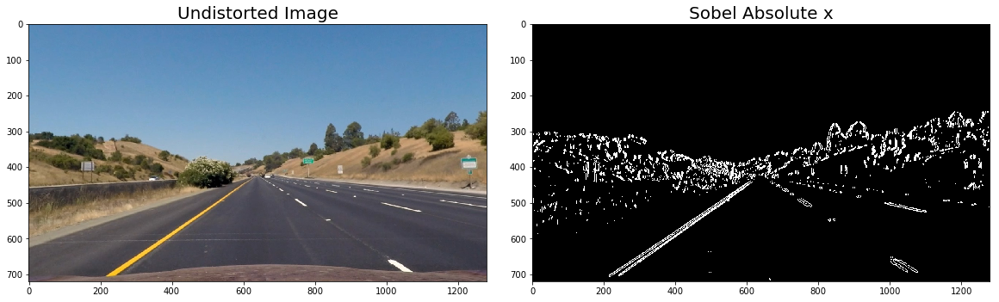

In [62]:
# apply Sobel absolute threshold to sample image in x direction
kernel_size = 15
min_thresh = 30
max_thresh = 100
img_sobelAbsx = abs_sobel_threshold(img_undistort, 'x', kernel_size, min_thresh, max_thresh)

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace=.2, wspace=.1)
ax1.imshow(img_undistort)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(img_sobelAbsx, cmap='gray')
ax2.set_title('Sobel Absolute x', fontsize=20)

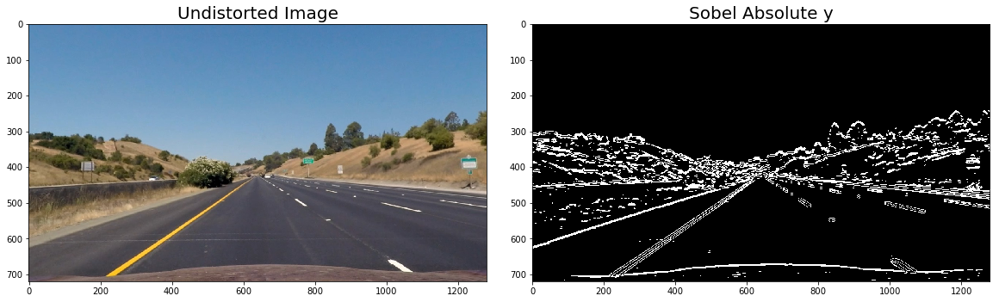

In [63]:
# apply Sobel absolute threshold to sample image in y direction
kernel_size = 15
min_thresh = 30
max_thresh = 100
img_sobelAbsy = abs_sobel_threshold(img_undistort, 'y', kernel_size, min_thresh, max_thresh)

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace=.2, wspace=.1)
ax1.imshow(img_undistort)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(img_sobelAbsy, cmap='gray')
ax2.set_title('Sobel Absolute y', fontsize=20)

## Sobel Magnitude Threshold

In [64]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_sobel_threshold(img, sobel_kernel=15, mag_thresh=(30, 100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # Calculate the gradient magnitude
    gradmag = np.sqrt(np.square(sobelx) + np.square(sobely)) 
    # Rescale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    # Return this mask as your binary_output image
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

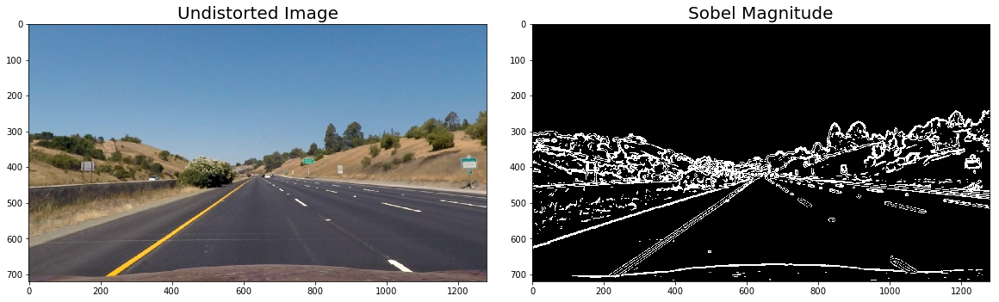

In [70]:
# Apply sobel magnitude threshold to sample image
kernel_size = 15
min_thresh  = 30
max_thresh  = 100
img_sobelMag = mag_sobel_threshold(img_undistort, kernel_size, (min_thresh, max_thresh))

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace=.2, wspace=.1)
ax1.imshow(img_undistort)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(img_sobelMag, cmap='gray')
ax2.set_title('Sobel Magnitude', fontsize=20)

## Sobel Direction Threshold

In [71]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_sobel_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # Calculate the direction of the gradient 
    absgraddir = np.arctan2(abs_sobely, abs_sobelx)
    # Create a binary mask where direction thresholds are met
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

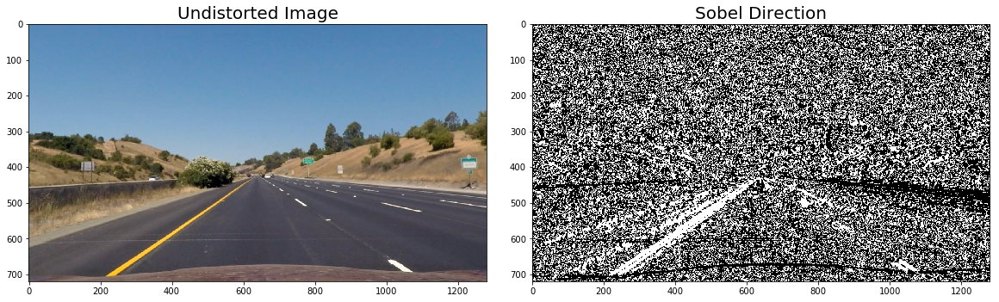

In [72]:
# Apply sobel direction threshold to sample image
kernel_size = 15
min_thresh  = 0.7
max_thresh  = 1.3
img_sobelDir = dir_sobel_threshold(img_undistort, kernel_size, (min_thresh, max_thresh))

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace=.2, wspace=.1)
ax1.imshow(img_undistort)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(img_sobelDir, cmap='gray')
ax2.set_title('Sobel Direction', fontsize=20)

## Combining Thresholds (Sobel Absolute + Sobel Magnitude + Sobel Direction)

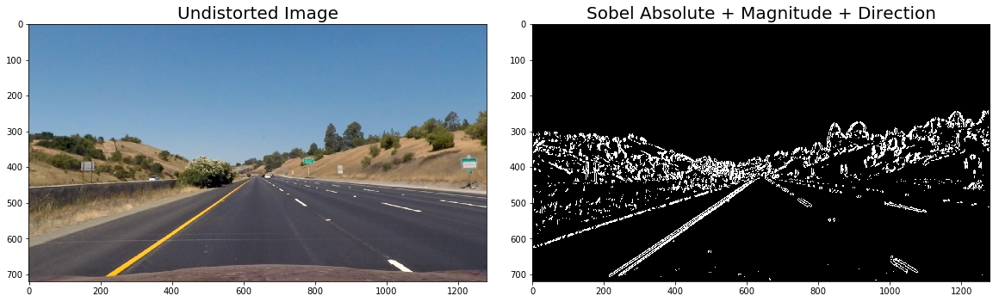

In [75]:
abs_kernel_size = 15 # Choose a larger odd number to smooth gradient measurements
abs_min_thresh  = 30
abs_max_thresh  = 100

mag_kernel_size = 15 # Choose a larger odd number to smooth gradient measurements
mag_min_thresh  = 30 
mag_max_thresh  = 100

dir_kernel_size = 15 # Choose a larger odd number to smooth gradient measurements
dir_min_thresh  = 0.7 
dir_max_thresh  = 1.3

# Apply sobel magnitude threshold and direction threshold to sample image
img_sobelAbsx2 = abs_sobel_threshold(img_undistort, 'x', abs_kernel_size, abs_min_thresh, abs_max_thresh)
img_sobelAbsy2 = abs_sobel_threshold(img_undistort, 'y', abs_kernel_size, abs_min_thresh, abs_max_thresh)
img_sobelMag2 = mag_sobel_threshold(img_undistort, mag_kernel_size, (mag_min_thresh, mag_max_thresh))
img_sobelDir2 = dir_sobel_threshold(img_undistort, dir_kernel_size, (dir_min_thresh, dir_max_thresh))

# Combine
img_combined = np.zeros_like(img_sobelMag2)
img_combined[(img_sobelAbsx2 == 1) | ((img_sobelMag2 == 1) & (img_sobelDir2 == 1)) ] = 1
#img_combined[((img_sobelAbsx2 == 1) & (img_sobelAbsy2 == 1)) | ((img_sobelMag2 == 1) & (img_sobelDir2 == 1)) ] = 1

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(img_undistort)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(img_combined, cmap='gray')
ax2.set_title('Sobel Absolute + Magnitude + Direction', fontsize=20)

## HLS H-Channel Threshold

In [78]:
# Define a function that thresholds the H-channel of HLS
def hls_hthreshold(img, thresh=(15, 100)):
    # convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # separate the H channel
    h_channel = hls[:,:,0]
    # Apply a threshold to the H channel
    binary_output = np.zeros_like(h_channel)
    binary_output[(h_channel > thresh[0]) & (h_channel <= thresh[1])] = 1
    # Return a binary image of threshold result
    return binary_output

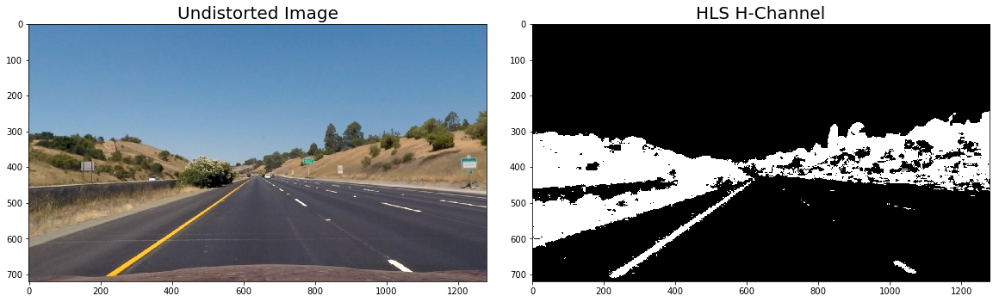

In [79]:
min_thresh = 15
max_thresh = 100

# Apply hls h-channel threshold
img_HThresh = hls_hthreshold(img_undistort, (min_thresh, max_thresh))

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace =.2, wspace=.1)
ax1.imshow(img_undistort)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(img_HThresh, cmap='gray')
ax2.set_title('HLS H-Channel', fontsize=20)

## HLS L-Channel Threshold

In [80]:
# Define a function that thresholds the L-channel of HLS
def hls_lthreshold(img, thresh=(220, 255)):
    # convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # separate the L channel
    l_channel = hls[:,:,1]
    # Apply a threshold to the L channel
    binary_output = np.zeros_like(l_channel)
    binary_output[(l_channel > thresh[0]) & (l_channel <= thresh[1])] = 1
    # Return a binary image of threshold result
    return binary_output

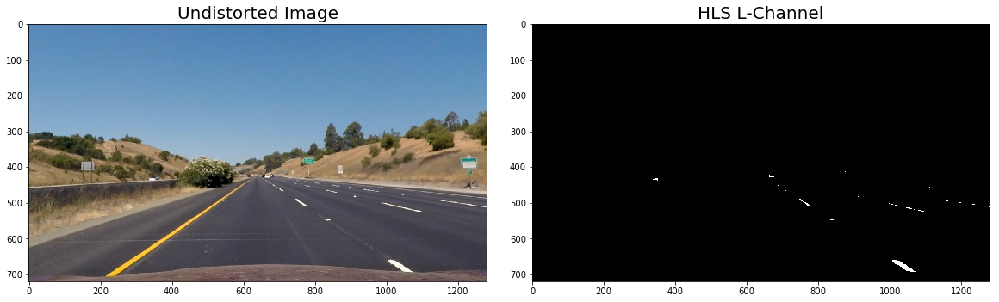

In [81]:
min_thresh = 220
max_thresh = 255

# Apply hls l-channel threshold
img_LThresh = hls_lthreshold(img_undistort, (min_thresh, max_thresh))

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace =.2, wspace=.1)
ax1.imshow(img_undistort)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(img_LThresh, cmap='gray')
ax2.set_title('HLS L-Channel', fontsize=20)

## HLS S-Channel Threshold

In [109]:
# Define a function that thresholds the S-channel of HLS
def hls_sthreshold(img, thresh=(170, 255)):
    # convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # separate the S channel
    s_channel = hls[:,:,2]
    # Apply a threshold to the S channel
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    # Return a binary image of threshold result
    return binary_output

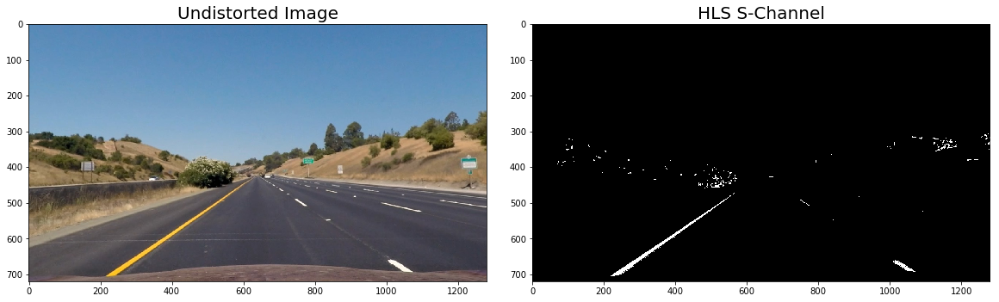

In [110]:
min_thresh = 170
max_thresh = 255

# Apply hls s-channel threshold
img_SThresh = hls_sthreshold(img_undistort, (min_thresh, max_thresh))

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace =.2, wspace=.1)
ax1.imshow(img_undistort)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(img_SThresh, cmap='gray')
ax2.set_title('HLS S-Channel', fontsize=20)

## HSV V-Channel Threshold

In [111]:
# Define a function that thresholds the V-channel of HSV
def hsv_vthreshold(img, thresh=(170, 255)):
    # convert to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # separate the V channel
    hsv_v = hsv[:,:,2]
    hsv_v = hsv_v*(255/np.max(hsv_v))
    # Apply a threshold to the V channel
    binary_output = np.zeros_like(hsv_v)
    binary_output[(hsv_v > thresh[0]) & (hsv_v <= thresh[1])] = 1
    # Return a binary image of threshold result
    return binary_output

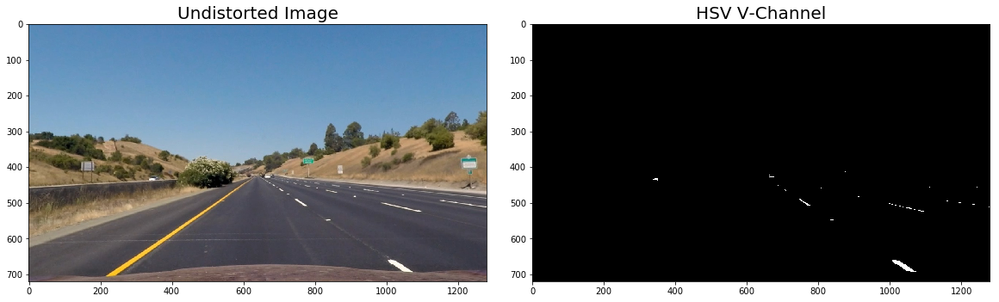

In [112]:
min_thresh = 170
max_thresh = 255

# Apply hsv v-channel threshold
img_VThresh = hsv_vthreshold(img_undistort, (min_thresh, max_thresh))

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace=.2, wspace=.1)
ax1.imshow(img_undistort)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(img_LThresh, cmap='gray')
ax2.set_title('HSV V-Channel', fontsize=20)

## LAB B-Channel Threshold

In [113]:
# Define a function that thresholds the B-channel of LAB
# B channel should capture yellows
def lab_bthreshold(img, thresh=(190,255)):
    # Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    # Separate the B channel
    lab_b = lab[:,:,2]
    # don't normalize if there are no yellows in the image
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    # Apply a threshold to the B channel
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    # Return a binary image of threshold result
    return binary_output

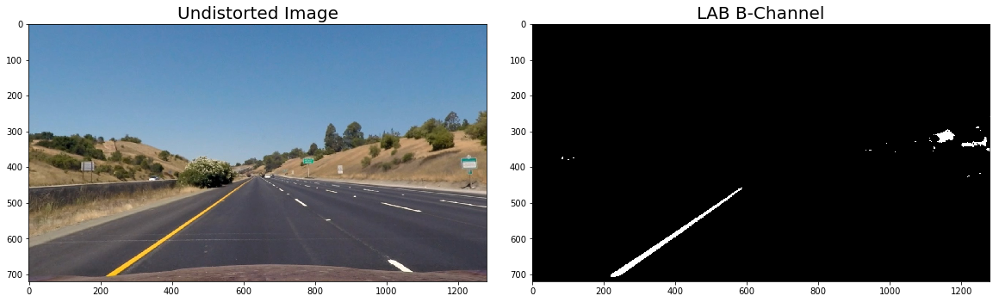

In [114]:
min_thresh = 190
max_thresh = 255

# Apply lab b-channel threshold
img_BThresh = lab_bthreshold(img_undistort, (min_thresh, max_thresh))

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace=.2, wspace=.1)
ax1.imshow(img_undistort)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(img_BThresh, cmap='gray')
ax2.set_title('LAB B-Channel', fontsize=20)

## Perspective Transform

In [115]:
def warper(img, src, dst):
    # get image size
    h,w = img.shape[:2]
    
    #  Compute M, the transformation matrix, given source and destination points 
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Compute Minv, the inverse transformation matrix
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Warp the image to a top-down view using the perspective transform, M
    # keep same size as input image
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

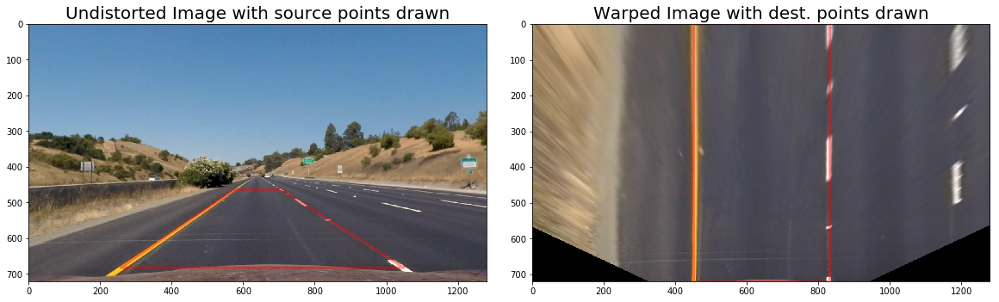

In [116]:
# get image size
h,w = img_undistort.shape[:2]

# define source and destination points for transform
src = np.float32([(575,464),
                  (707,464), 
                  (258,682), 
                  (1049,682)])
dst = np.float32([(450,0),
                  (w-450,0),
                  (450,h),
                  (w-450,h)])

img_warp, M, Minv = warper(img_undistort, src, dst)

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(img_undistort)
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color='#ff0000', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([h,0])
ax1.set_xlim([0,w])
ax1.set_title('Undistorted Image with source points drawn', fontsize=20)
x = [dst[0][0],dst[2][0],dst[3][0],dst[1][0],dst[0][0]]
y = [dst[0][1],dst[2][1],dst[3][1],dst[1][1],dst[0][1]]
ax2.plot(x, y, color='#ff0000', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax2.imshow(img_warp)
ax2.set_title('Warped Image with dest. points drawn', fontsize=20)

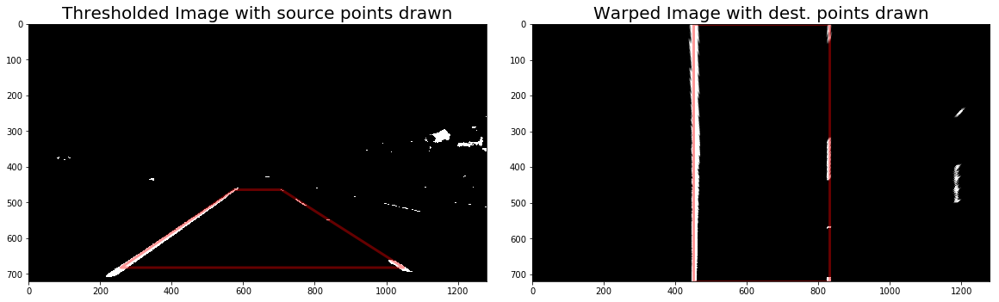

In [117]:
# threshold image

# HLS L-channel Threshold (using default parameters)
img_LThresh = hls_lthreshold(img_undistort)
    
# Lab B-channel Threshold (using default parameters)
img_BThresh = lab_bthreshold(img_undistort)
    
# Combine HLS L-channel and Lab B-channel thresholds
combined = np.zeros_like(img_BThresh)
combined[(img_LThresh == 1) | (img_BThresh == 1)] = 1
    
img_thresholded = combined

# get image size
h,w = img_thresholded.shape[:2]

# define source and destination points for transform
src = np.float32([(575,464),
                  (707,464), 
                  (258,682), 
                  (1049,682)])
dst = np.float32([(450,0),
                  (w-450,0),
                  (450,h),
                  (w-450,h)])

img_warp, M, Minv = warper(img_thresholded, src, dst)

# Visualization
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.1)
ax1.imshow(img_thresholded, cmap='gray')
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color='#ff0000', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([h,0])
ax1.set_xlim([0,w])
ax1.set_title('Thresholded Image with source points drawn', fontsize=20)
x = [dst[0][0],dst[2][0],dst[3][0],dst[1][0],dst[0][0]]
y = [dst[0][1],dst[2][1],dst[3][1],dst[1][1],dst[0][1]]
ax2.plot(x, y, color='#ff0000', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax2.imshow(img_warp, cmap='gray')
ax2.set_title('Warped Image with dest. points drawn', fontsize=20)

# Pipeline

In [119]:
# Define the complete image processing pipeline, 
# reads raw image and returns binary image with lane lines identified as much as possible
def pipeline(img):
    # Undistort
    img_undistort = undistort(img, mtx, dist)

    # Sobel Absolute (using default parameters)
    img_sobelAbs = abs_sobel_threshold(img_undistort)

    # Sobel Magnitude (using default parameters)
    img_sobelMag = mag_sobel_threshold(img_undistort)
    
    # Sobel Direction (using default parameters)
    img_sobelDir = dir_sobel_threshold(img_undistort)
    
    # HLS H-channel Threshold (using default parameters)
    img_HThresh = hls_hthreshold(img_undistort)
    
    # HLS L-channel Threshold (using default parameters)
    img_LThresh = hls_lthreshold(img_undistort)
    
    # HLS S-channel Threshold (using default parameters)
    img_SThresh = hls_sthreshold(img_undistort)

    # HSV V-channel Threshold (using default parameters)
    img_VThresh = hsv_vthreshold(img_undistort)
    
    # Lab B-channel Threshold (using default parameters)
    img_BThresh = lab_bthreshold(img_undistort)
    
    # Combine HLS L-channel and Lab B-channel thresholds
    combined = np.zeros_like(img_BThresh)
    combined[(img_LThresh == 1) | (img_BThresh == 1)] = 1
    
    # Perspective Transform
    warped, M, Minv = warper(combined, src, dst)
    
    return warped, Minv

## Pipeline (Test Images)

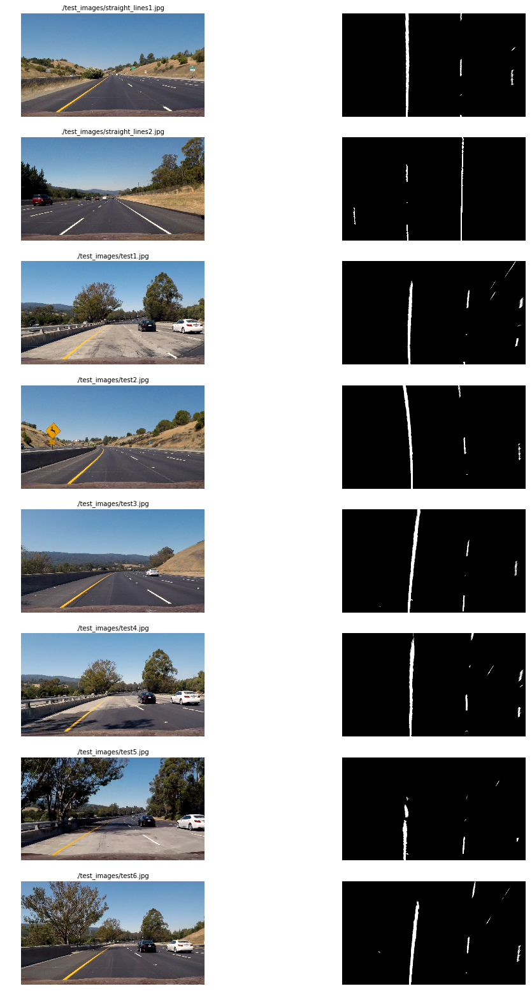

In [120]:
# Make a list of example images
images = glob.glob('./test_images/*.jpg')
                                          
# Set up figures
fig, axs = plt.subplots(len(images),2, figsize=(18, 28))
fig.subplots_adjust(hspace=.2, wspace=.005)
axs = axs.ravel()
                  
i = 0
for image in images:
    img = cv2.imread(image)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_bin, Minv = pipeline(img)
    axs[i].set_title(image, fontsize=10)
    axs[i].imshow(img)
    axs[i].axis('off')
    i += 1
    axs[i].imshow(img_bin, cmap='gray')
    axs[i].axis('off')
    i += 1

## Locate Lane Lines Using Sliding Window Search

In [121]:
# Define method to fit polynomial to binary image with lines extracted, using sliding window
def polyfit_using_sliding_window_search(img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero  = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds  = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    visualization_data = (rectangle_data, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data

(720, 0)

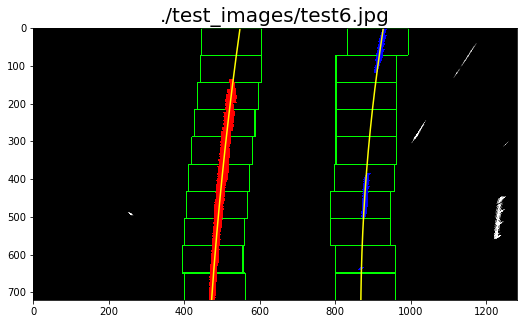

In [124]:
# visualize the result on example image
fname = './test_images/test6.jpg'
img = cv2.imread(fname)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_bin, Minv = pipeline(img)
    
left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = polyfit_using_sliding_window_search(img_bin)

h = img.shape[0]
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]

rectangles = visualization_data[0]
histogram = visualization_data[1]

# Create an output image to draw on and  visualize the result
out_img = np.uint8(np.dstack((img_bin, img_bin, img_bin))*255)

# Generate x and y values for plotting
ploty = np.linspace(0, img_bin.shape[0]-1, img_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

for rect in rectangles:
    # Draw the windows on the visualization image
    win_y_low       = rect[0]
    win_y_high      = rect[1]
    win_xleft_low   = rect[2]
    win_xleft_high  = rect[3]
    win_xright_low  = rect[4]
    win_xright_high = rect[5]
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
    
# Identify the x and y positions of all nonzero pixels in the image
nonzero = img_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

plt.figure(figsize=(10,5))
plt.imshow(out_img)
plt.title(fname, fontsize=20)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)


(0, 1280)

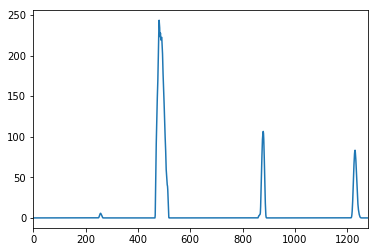

In [125]:
# Print histogram from sliding window polyfit for example image
plt.plot(histogram)
plt.xlim(0, 1280)

## Locate Lane Lines Using Fit from Previous Frame

In [126]:
# Define method to fit polynomial to binary image based upon a previous fit
# this assumes that the fit will not change significantly from one video frame to the next
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
def polyfit_using_prev_fit(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds  = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

(720, 0)

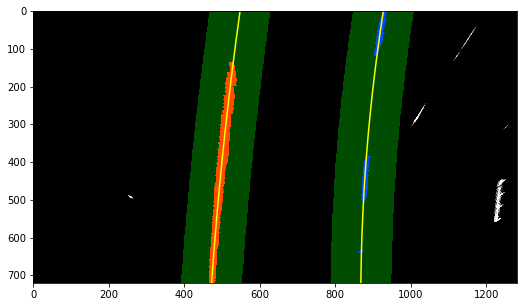

In [127]:
# visualize the result on example image
img = cv2.imread('./test_images/test6.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_bin, Minv = pipeline(img)   
margin = 80

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_using_prev_fit(img_bin, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, img_bin.shape[0]-1, img_bin.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((img_bin, img_bin, img_bin))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = img_bin.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area (OLD FIT)
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255,0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255,0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.figure(figsize=(10,5))
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

## Measuring Curvature

In [131]:
# Method to determine radius of curvature and distance from lane center 
# based on binary image, polynomial fit, and L and R lane pixel indices
def measure_curv_and_center_dist(img_bin, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension, lane length is 30 meters
    xm_per_pix = 3.7/380 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = img_bin.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img_bin.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = img_bin.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
        
    return left_curverad, right_curverad, center_dist

In [132]:
rad_l, rad_r, d_center = measure_curv_and_center_dist(img_bin, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center:', d_center, 'm')

Radius of curvature: 1816.22359721 m, 881.177067912 m
Distance from lane center: -0.292282049342 m


## Draw the Detected Lane 

In [133]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,0), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,0,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    
    return result

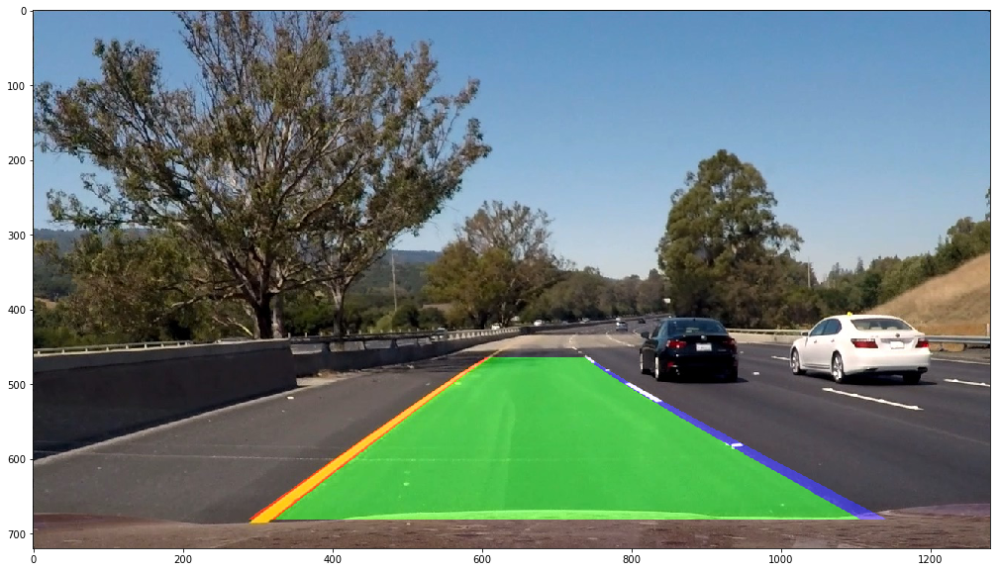

In [134]:
out_img = draw_lane(img, img_bin, left_fit, right_fit, Minv)
plt.figure(figsize=(20,10))
plt.imshow(out_img)

## Draw Curvature Radius and Distance

In [135]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = 'Radius of Curvature = ' + '{:4.0f}'.format(curv_rad) + '(m)'
    cv2.putText(new_img, text, (40,50), font, 2.0, (255,255,255), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = 'Vehicle is {:04.2f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,100), font, 2.0, (255,255,255), 2, cv2.LINE_AA)
    return new_img

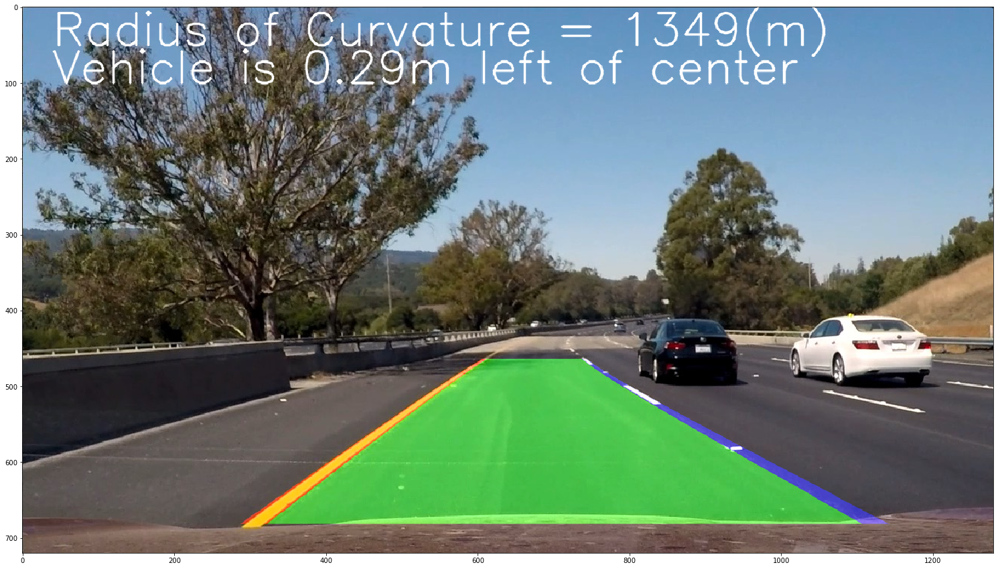

In [136]:
out_img = draw_data(out_img, (rad_l+rad_r)/2, d_center)
plt.figure(figsize=(30,15))
plt.imshow(out_img)

## Line Class for Storing Data

In [137]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
        
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit but if there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)


## Complete Image Processing Pipeline

In [138]:
def process_image(img):
    new_img = np.copy(img)
    img_bin, Minv = pipeline(new_img)
    
    # if both left and right lines were detected last frame, use polyfit_using_prev_fit, otherwise use sliding window
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = polyfit_using_sliding_window_search(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_using_prev_fit(img_bin, l_line.best_fit, r_line.best_fit)
        
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit, Minv)
        rad_l, rad_r, d_center = measure_curv_and_center_dist(img_bin, l_line.best_fit, r_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        img_out = draw_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
    
    return img_out

#  Video

In [139]:
l_line = Line()
r_line = Line()
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [05:54<00:00,  3.61it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 19min 40s, sys: 1min 46s, total: 21min 27s
Wall time: 5min 55s
